In [1]:
%matplotlib inline 
import json
import numpy as np
import operator
import os
import pandas
import pylab as plt
import random
from ase.data import reference_states, atomic_numbers
from sklearn.neighbors.kde import KernelDensity
from pyiron.project import Project

/scratch/janssen/pyiron_meltingpoint_al/.snakemake/conda/85ceb4eb/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.kde module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
import matplotlib as mpl
mpl.rc('font', family='Times New Roman')
plt.rcParams["mathtext.fontset"] = "stix"

In [3]:
from pyiron.thermodynamics.interfacemethod import freeze_one_half, remove_selective_dynamics, set_server, create_job_template, fix_iso, fix_z_dir, half_velocity, minimize_pos, minimize_vol, next_calc, npt_solid, npt_liquid, next_step_funct, round_temperature_next, strain_circle, analyse_minimized_structure, get_press, get_center_point, get_strain_lst, get_nve_job_name, plot_solid_liquid_ratio, ratio_selection, plot_equilibration, plot_melting_point_prediction, calc_temp_iteration, get_initial_melting_temperature_guess, validate_convergence, initialise_iterators, get_voronoi_volume, check_for_holes

In [4]:
pr = Project('melting')

In [5]:
input_file = os.path.join(pr.path, 'input.json')
output_file = os.path.join(pr.path, 'output.json')

In [6]:
# Parameters
input_file = "input.json"
output_file = "output.json"


In [7]:
pr.job_table()

""


In [8]:
if os.path.exists(input_file) and os.stat(input_file).st_size != 0:
    with open(input_file, 'r') as f:
        input_dict = json.load(f)
else:
    input_dict = {
        "config": [
            "pair_style morse 9.97749\n",
            "pair_coeff * * 0.4174 1.3885 2.845\n"
        ],
        "species": ["Al"],
        "element": "Al"
    }


In [9]:
input_dict

{'config': ['pair_style eam/fs \n', 'pair_coeff * * Al1.eam.fs Al\n'],
 'filename': './examples/fccAl/Al1.eam.fs',
 'species': ['Al'],
 'element': 'Al',
 'cpu_cores': 8}

In [10]:
pot_dict = input_dict.copy()

In [11]:
if 'model' not in pot_dict.keys():
    pot_dict['model'] = 'Lammps'
if 'name' not in pot_dict.keys():
    pot_dict['name'] = 'CustomPotential'
if 'filename' not in pot_dict.keys():
    pot_path = []
else:
    pot_path = [os.path.abspath(pot_dict['filename'])]
potential = pandas.DataFrame({'Config': [pot_dict['config']],
                             'Filename': [pot_path],
                             'Model': [pot_dict['model']],
                             'Name': [pot_dict['name']],
                             'Species': [pot_dict['species']]
                             })

In [12]:
project_parameter = {
    'project': pr,
    'run_time_steps': 50000,
    'nvt_run_time_steps': 10000,
    'nve_run_time_steps': 10000,
    'temperature_left': 0,
    'temperature_right': 1000,
    'strain_run_time_steps': 1000,
    'convergence_criterion': 1,
    'potential': potential,
    'cpu_cores': 1, 
    'job_type': pr.job_type.Lammps,
    'enable_h5md': False,
    'points': 21,
    'boundary_value': 0.25,
    'ratio_boundary': 0.25,
    'timestep_lst': [2, 2, 1],
    'fit_range_lst': [0.05, 0.01, 0.01],
    'nve_run_time_steps_lst': [25000, 20000, 50000],
    'number_of_atoms': 8000, 
}

In [13]:
for k in input_dict.keys():
    project_parameter[k] = input_dict[k]

In [14]:
if 'crystalstructure' not in project_parameter.keys():
    project_parameter['crystalstructure'] = reference_states[atomic_numbers[project_parameter['element']]]['symmetry']

In [15]:
if 'seed' not in project_parameter.keys():
    project_parameter['seed'] = random.randint(0,99999)
project_parameter['seed']

9055

In [16]:
# Values from a previous calculation can be inserted here to reproduce the results 
step_dict = {}
if os.path.exists(output_file):
    with open(output_file, 'r') as f:
        step_dict_str = json.load(f)
    for k,v in step_dict_str.items():
        step_dict[int(k)] = v
step_dict

{}

# From here on the notebook is automated - no change required !

In [17]:
step_count = 0
temperature_next = None
enable_iteration = True
convergence_goal_achieved = False

In [18]:
pr = project_parameter['project']

In [19]:
if 'lattice_constant' in project_parameter.keys():
    basis = pr.create_structure(project_parameter['element'], project_parameter['crystalstructure'].lower(), project_parameter['lattice_constant'])
elif project_parameter['crystalstructure'] == 'hcp':
    basis = pr.create_ase_bulk(project_parameter['element'], project_parameter['crystalstructure'].lower(), cubic=False)
else:
    basis = pr.create_ase_bulk(project_parameter['element'], project_parameter['crystalstructure'].lower(), cubic=True)
basis_lst = [basis.repeat([i, i, i]) for i in range(5,30)]
basis = basis_lst[np.argmin([np.abs(len(b)-project_parameter['number_of_atoms']/2) for b in basis_lst])]

In [20]:
basis.analyse_ovito_cna_adaptive()

{'CommonNeighborAnalysis.counts.BCC': 0, 'CommonNeighborAnalysis.counts.FCC': 4000, 'CommonNeighborAnalysis.counts.HCP': 0, 'CommonNeighborAnalysis.counts.ICO': 0, 'CommonNeighborAnalysis.counts.OTHER': 0}

In [21]:
basis.plot3d()

_ColormakerRegistry()

NGLWidget()

In [22]:
# pr.remove_jobs(recursive=True)

In [23]:
timestep_iter, fit_range_iter, nve_run_time_steps_iter = initialise_iterators(project_parameter)
timestep = next(timestep_iter)
fit_range = next(fit_range_iter)
nve_run_time_steps = next(nve_run_time_steps_iter)

In [24]:
pr.job_table()

""


# Step 1: set up the solid sample and roughly estimate a melting point

In [25]:
ham_minimize_pos= minimize_pos(
    structure=basis, 
    project_parameter=project_parameter
)

The job minimize_pos was saved and received the ID: 1


In [26]:
ham_minimize_vol = minimize_vol(
    structure=ham_minimize_pos.get_structure(), 
    project_parameter=project_parameter
)

The job minimize_vol was saved and received the ID: 2


In [27]:
temperature_next, structure_left = get_initial_melting_temperature_guess(
    project_parameter=project_parameter, 
    ham_minimize_vol=ham_minimize_vol, 
    temperature_next=temperature_next
)

The job temp_heating_1000 was saved and received the ID: 3


The job temp_heating_500_0 was saved and received the ID: 4


The job temp_heating_750_0 was saved and received the ID: 5


The job temp_heating_875_0 was saved and received the ID: 6


The job temp_heating_937_5 was saved and received the ID: 7


The job temp_heating_906_25 was saved and received the ID: 8


The job temp_heating_921_875 was saved and received the ID: 9


The job temp_heating_914_0625 was saved and received the ID: 10


In [28]:
temperature_next   # +/- 100K 

914

In [29]:
if step_count in step_dict.keys():
    temperature_next = step_dict[step_count]['temperature_next']
else: 
    step_dict[step_count]= {'temperature_next': temperature_next}

In [30]:
step_dict

{0: {'temperature_next': 914}}

# Step 2: set up the interface structure

The job ham_npt_solid_914 was saved and received the ID: 11


The job ham_npt_liquid_high_1914 was saved and received the ID: 12


The job ham_npt_liquid_low_914 was saved and received the ID: 13


2020-05-04 08:09:03,009 - pyiron_log - WARNING - Job 'ham_nve_0_95_914_0' does not exist and cannot be loaded


The job ham_nvt_0_95_914_0 was saved and received the ID: 14


2020-05-04 08:11:50,055 - pyiron_log - WARNING - Job 'ham_nve_0_955_914_0' does not exist and cannot be loaded


The job ham_nvt_0_955_914_0 was saved and received the ID: 15


2020-05-04 08:14:51,053 - pyiron_log - WARNING - Job 'ham_nve_0_96_914_0' does not exist and cannot be loaded


The job ham_nvt_0_96_914_0 was saved and received the ID: 16


2020-05-04 08:17:29,226 - pyiron_log - WARNING - Job 'ham_nve_0_965_914_0' does not exist and cannot be loaded


The job ham_nvt_0_965_914_0 was saved and received the ID: 17


2020-05-04 08:20:04,949 - pyiron_log - WARNING - Job 'ham_nve_0_97_914_0' does not exist and cannot be loaded


The job ham_nvt_0_97_914_0 was saved and received the ID: 18


2020-05-04 08:23:03,209 - pyiron_log - WARNING - Job 'ham_nve_0_975_914_0' does not exist and cannot be loaded


The job ham_nvt_0_975_914_0 was saved and received the ID: 19


2020-05-04 08:25:23,413 - pyiron_log - WARNING - Job 'ham_nve_0_98_914_0' does not exist and cannot be loaded


The job ham_nvt_0_98_914_0 was saved and received the ID: 20


2020-05-04 08:27:46,279 - pyiron_log - WARNING - Job 'ham_nve_0_985_914_0' does not exist and cannot be loaded


The job ham_nvt_0_985_914_0 was saved and received the ID: 21


2020-05-04 08:30:29,348 - pyiron_log - WARNING - Job 'ham_nve_0_99_914_0' does not exist and cannot be loaded


The job ham_nvt_0_99_914_0 was saved and received the ID: 22


2020-05-04 08:32:46,916 - pyiron_log - WARNING - Job 'ham_nve_0_995_914_0' does not exist and cannot be loaded


The job ham_nvt_0_995_914_0 was saved and received the ID: 23


2020-05-04 08:35:26,157 - pyiron_log - WARNING - Job 'ham_nve_1_0_914_0' does not exist and cannot be loaded


The job ham_nvt_1_0_914_0 was saved and received the ID: 24


2020-05-04 08:38:04,248 - pyiron_log - WARNING - Job 'ham_nve_1_005_914_0' does not exist and cannot be loaded


The job ham_nvt_1_005_914_0 was saved and received the ID: 25


2020-05-04 08:40:30,044 - pyiron_log - WARNING - Job 'ham_nve_1_01_914_0' does not exist and cannot be loaded


The job ham_nvt_1_01_914_0 was saved and received the ID: 26


2020-05-04 08:43:02,714 - pyiron_log - WARNING - Job 'ham_nve_1_015_914_0' does not exist and cannot be loaded


The job ham_nvt_1_015_914_0 was saved and received the ID: 27


2020-05-04 08:45:39,582 - pyiron_log - WARNING - Job 'ham_nve_1_02_914_0' does not exist and cannot be loaded


The job ham_nvt_1_02_914_0 was saved and received the ID: 28


2020-05-04 08:48:06,195 - pyiron_log - WARNING - Job 'ham_nve_1_025_914_0' does not exist and cannot be loaded


The job ham_nvt_1_025_914_0 was saved and received the ID: 29


2020-05-04 08:50:29,674 - pyiron_log - WARNING - Job 'ham_nve_1_03_914_0' does not exist and cannot be loaded


The job ham_nvt_1_03_914_0 was saved and received the ID: 30


2020-05-04 08:53:01,205 - pyiron_log - WARNING - Job 'ham_nve_1_035_914_0' does not exist and cannot be loaded


The job ham_nvt_1_035_914_0 was saved and received the ID: 31


2020-05-04 08:55:46,105 - pyiron_log - WARNING - Job 'ham_nve_1_04_914_0' does not exist and cannot be loaded


The job ham_nvt_1_04_914_0 was saved and received the ID: 32


2020-05-04 08:58:17,179 - pyiron_log - WARNING - Job 'ham_nve_1_045_914_0' does not exist and cannot be loaded


The job ham_nvt_1_045_914_0 was saved and received the ID: 33


2020-05-04 09:00:49,381 - pyiron_log - WARNING - Job 'ham_nve_1_05_914_0' does not exist and cannot be loaded


The job ham_nvt_1_05_914_0 was saved and received the ID: 34


The job ham_nve_0_95_914_0 was saved and received the ID: 35


The job ham_nve_0_955_914_0 was saved and received the ID: 36


The job ham_nve_0_96_914_0 was saved and received the ID: 37


The job ham_nve_0_965_914_0 was saved and received the ID: 38


The job ham_nve_0_97_914_0 was saved and received the ID: 39


The job ham_nve_0_975_914_0 was saved and received the ID: 40


The job ham_nve_0_98_914_0 was saved and received the ID: 41


The job ham_nve_0_985_914_0 was saved and received the ID: 42


The job ham_nve_0_99_914_0 was saved and received the ID: 43


The job ham_nve_0_995_914_0 was saved and received the ID: 44


The job ham_nve_1_0_914_0 was saved and received the ID: 45


The job ham_nve_1_005_914_0 was saved and received the ID: 46


The job ham_nve_1_01_914_0 was saved and received the ID: 47


The job ham_nve_1_015_914_0 was saved and received the ID: 48


The job ham_nve_1_02_914_0 was saved and received the ID: 49


The job ham_nve_1_025_914_0 was saved and received the ID: 50


The job ham_nve_1_03_914_0 was saved and received the ID: 51


The job ham_nve_1_035_914_0 was saved and received the ID: 52


The job ham_nve_1_04_914_0 was saved and received the ID: 53


The job ham_nve_1_045_914_0 was saved and received the ID: 54


The job ham_nve_1_05_914_0 was saved and received the ID: 55


findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.


findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.


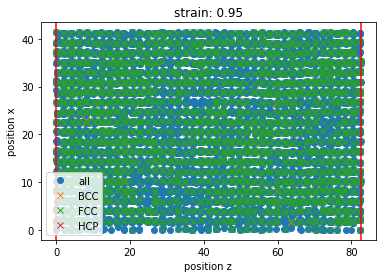

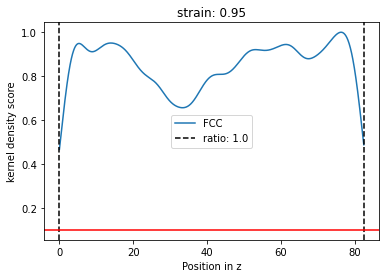

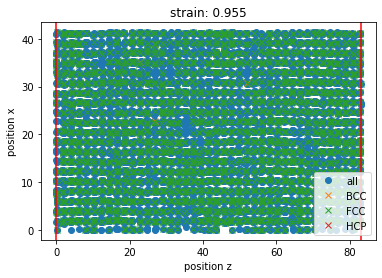

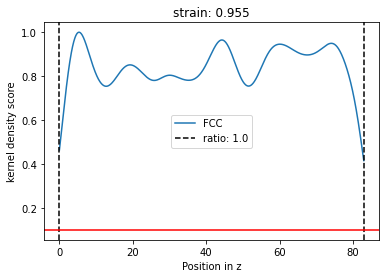

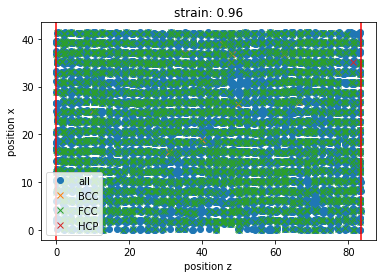

...

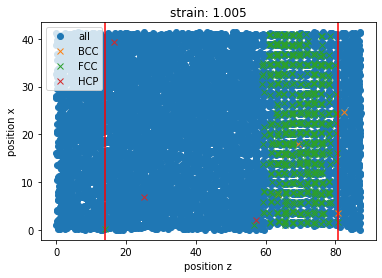

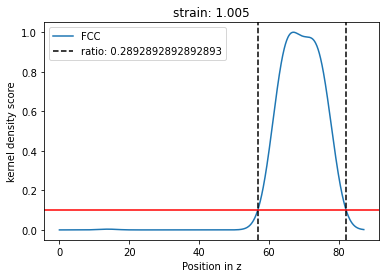

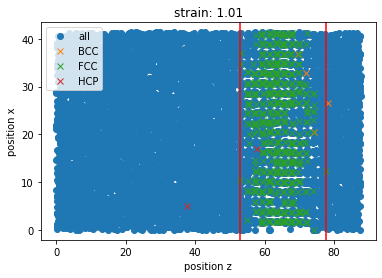

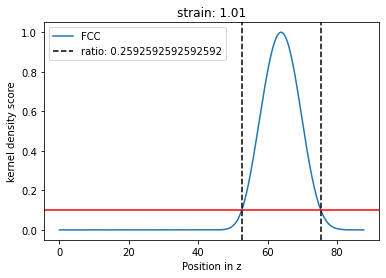

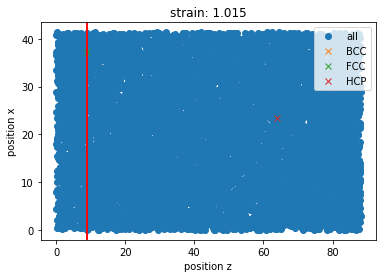

No handles with labels found to put in legend.


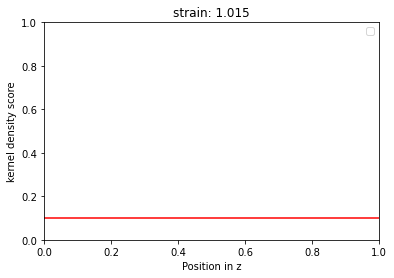

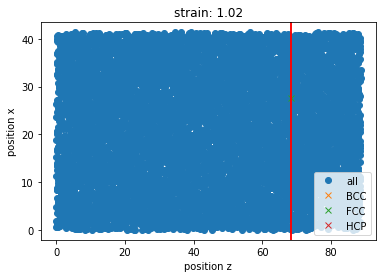

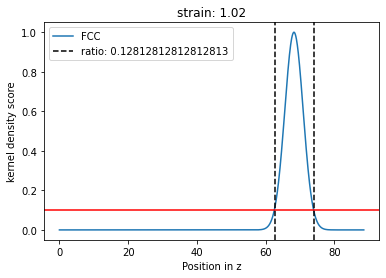

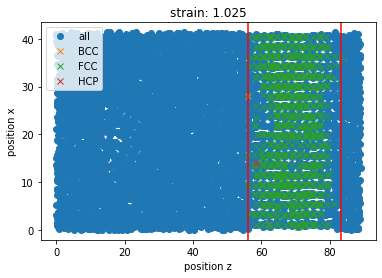

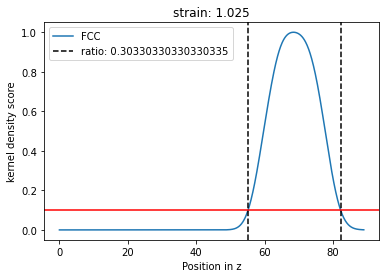

...

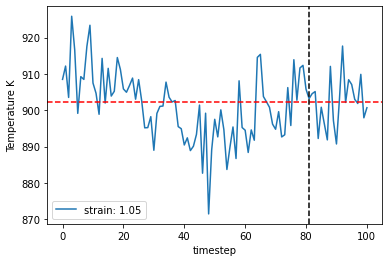

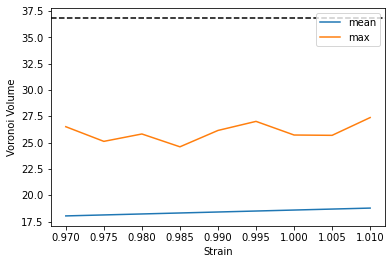

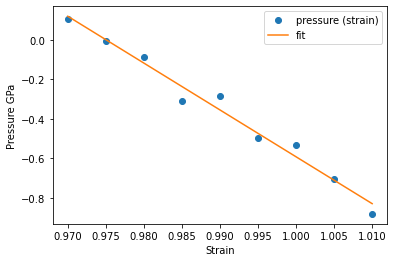

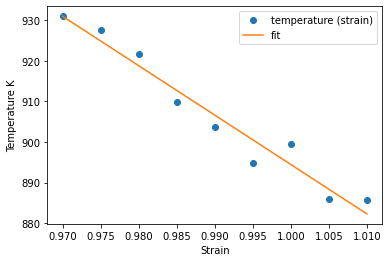

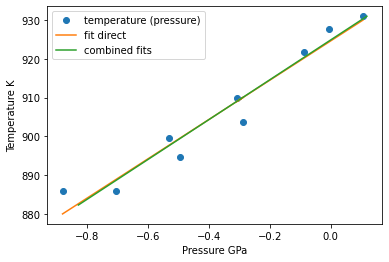

924.6497033033917 924.9040849329467


In [31]:
temperature_next, temperature_mean, temperature_left, temperature_right, strain_result_lst, pressure_result_lst = calc_temp_iteration(
        basis=ham_minimize_vol.get_structure().repeat([1,1,2]), 
        temperature_next=temperature_next, 
        project_parameter=project_parameter,
        timestep = timestep,
        nve_run_time_steps=nve_run_time_steps, 
        fit_range=fit_range,  
        center=None,
        debug_plot=True)

In [32]:
temperature_next, temperature_mean, temperature_left, temperature_right

(924.6497033033917, 908.3706333224939, 897.0722807793567, 919.6689858656309)

# Step 3: run NVT and NVE MD

In [33]:
output = validate_convergence(
    pr=pr,
    temperature_left=temperature_left,
    temperature_next=temperature_next,
    temperature_right=temperature_right,
    enable_iteration=enable_iteration,
    timestep_iter=timestep_iter,
    timestep_lst=project_parameter['timestep_lst'],
    timestep=timestep,
    fit_range_iter=fit_range_iter,
    fit_range_lst=project_parameter['fit_range_lst'],
    fit_range=fit_range,
    nve_run_time_steps_iter=nve_run_time_steps_iter,
    nve_run_time_steps_lst=project_parameter['nve_run_time_steps_lst'],
    nve_run_time_steps=nve_run_time_steps,
    strain_result_lst=strain_result_lst,
    pressure_result_lst=pressure_result_lst,
    step_count=step_count,
    step_dict=step_dict,
    boundary_value=project_parameter['boundary_value'],
    ratio_boundary=project_parameter['ratio_boundary'],
    convergence_goal=project_parameter['convergence_criterion'],
    output_file=output_file
)
convergence_goal_achieved, enable_iteration, step_count, step_dict, timestep, fit_range, nve_run_time_steps, boundary_value, ratio_boundary, temperature_next, center = output

In [34]:
step_dict[step_count]

{'timestep': 2,
 'fit_range': 0.05,
 'nve_run_time_steps': 25000,
 'boundary_value': 0.25,
 'ratio_boundary': 0.25,
 'temperature_next': 924.6497033033917,
 'center': 0.98}

In [35]:
convergence_goal_achieved

False

# Step 4: full cycle, predict the final melting point

The job ham_npt_solid_924_65 was saved and received the ID: 56


The job ham_npt_liquid_high_1924_65 was saved and received the ID: 57


The job ham_npt_liquid_low_924_65 was saved and received the ID: 58


2020-05-04 11:53:24,406 - pyiron_log - WARNING - Job 'ham_nve_0_93_924_65_0' does not exist and cannot be loaded


The job ham_nvt_0_93_924_65_0 was saved and received the ID: 59


2020-05-04 11:56:09,417 - pyiron_log - WARNING - Job 'ham_nve_0_935_924_65_0' does not exist and cannot be loaded


The job ham_nvt_0_935_924_65_0 was saved and received the ID: 60


2020-05-04 11:58:38,279 - pyiron_log - WARNING - Job 'ham_nve_0_94_924_65_0' does not exist and cannot be loaded


The job ham_nvt_0_94_924_65_0 was saved and received the ID: 61


2020-05-04 12:01:20,558 - pyiron_log - WARNING - Job 'ham_nve_0_945_924_65_0' does not exist and cannot be loaded


The job ham_nvt_0_945_924_65_0 was saved and received the ID: 62


2020-05-04 12:04:16,497 - pyiron_log - WARNING - Job 'ham_nve_0_95_924_65_0' does not exist and cannot be loaded


The job ham_nvt_0_95_924_65_0 was saved and received the ID: 63


2020-05-04 12:07:01,501 - pyiron_log - WARNING - Job 'ham_nve_0_955_924_65_0' does not exist and cannot be loaded


The job ham_nvt_0_955_924_65_0 was saved and received the ID: 64


2020-05-04 12:09:43,962 - pyiron_log - WARNING - Job 'ham_nve_0_96_924_65_0' does not exist and cannot be loaded


The job ham_nvt_0_96_924_65_0 was saved and received the ID: 65


2020-05-04 12:12:17,518 - pyiron_log - WARNING - Job 'ham_nve_0_965_924_65_0' does not exist and cannot be loaded


The job ham_nvt_0_965_924_65_0 was saved and received the ID: 66


2020-05-04 12:14:54,091 - pyiron_log - WARNING - Job 'ham_nve_0_97_924_65_0' does not exist and cannot be loaded


The job ham_nvt_0_97_924_65_0 was saved and received the ID: 67


2020-05-04 12:17:31,972 - pyiron_log - WARNING - Job 'ham_nve_0_975_924_65_0' does not exist and cannot be loaded


The job ham_nvt_0_975_924_65_0 was saved and received the ID: 68


2020-05-04 12:20:04,312 - pyiron_log - WARNING - Job 'ham_nve_0_98_924_65_0' does not exist and cannot be loaded


The job ham_nvt_0_98_924_65_0 was saved and received the ID: 69


2020-05-04 12:22:18,610 - pyiron_log - WARNING - Job 'ham_nve_0_985_924_65_0' does not exist and cannot be loaded


The job ham_nvt_0_985_924_65_0 was saved and received the ID: 70


2020-05-04 12:24:44,601 - pyiron_log - WARNING - Job 'ham_nve_0_99_924_65_0' does not exist and cannot be loaded


The job ham_nvt_0_99_924_65_0 was saved and received the ID: 71


2020-05-04 12:27:15,793 - pyiron_log - WARNING - Job 'ham_nve_0_995_924_65_0' does not exist and cannot be loaded


The job ham_nvt_0_995_924_65_0 was saved and received the ID: 72


2020-05-04 12:29:48,789 - pyiron_log - WARNING - Job 'ham_nve_1_0_924_65_0' does not exist and cannot be loaded


The job ham_nvt_1_0_924_65_0 was saved and received the ID: 73


2020-05-04 12:32:00,804 - pyiron_log - WARNING - Job 'ham_nve_1_005_924_65_0' does not exist and cannot be loaded


The job ham_nvt_1_005_924_65_0 was saved and received the ID: 74


2020-05-04 12:34:15,358 - pyiron_log - WARNING - Job 'ham_nve_1_01_924_65_0' does not exist and cannot be loaded


The job ham_nvt_1_01_924_65_0 was saved and received the ID: 75


2020-05-04 12:36:46,049 - pyiron_log - WARNING - Job 'ham_nve_1_015_924_65_0' does not exist and cannot be loaded


The job ham_nvt_1_015_924_65_0 was saved and received the ID: 76


2020-05-04 12:38:57,073 - pyiron_log - WARNING - Job 'ham_nve_1_02_924_65_0' does not exist and cannot be loaded


The job ham_nvt_1_02_924_65_0 was saved and received the ID: 77


2020-05-04 12:41:36,916 - pyiron_log - WARNING - Job 'ham_nve_1_025_924_65_0' does not exist and cannot be loaded


The job ham_nvt_1_025_924_65_0 was saved and received the ID: 78


2020-05-04 12:43:43,060 - pyiron_log - WARNING - Job 'ham_nve_1_03_924_65_0' does not exist and cannot be loaded


The job ham_nvt_1_03_924_65_0 was saved and received the ID: 79


The job ham_nve_0_93_924_65_0 was saved and received the ID: 80


The job ham_nve_0_935_924_65_0 was saved and received the ID: 81


The job ham_nve_0_94_924_65_0 was saved and received the ID: 82


The job ham_nve_0_945_924_65_0 was saved and received the ID: 83


The job ham_nve_0_95_924_65_0 was saved and received the ID: 84


The job ham_nve_0_955_924_65_0 was saved and received the ID: 85


The job ham_nve_0_96_924_65_0 was saved and received the ID: 86


The job ham_nve_0_965_924_65_0 was saved and received the ID: 87


The job ham_nve_0_97_924_65_0 was saved and received the ID: 88


The job ham_nve_0_975_924_65_0 was saved and received the ID: 89


The job ham_nve_0_98_924_65_0 was saved and received the ID: 90


The job ham_nve_0_985_924_65_0 was saved and received the ID: 91


The job ham_nve_0_99_924_65_0 was saved and received the ID: 92


The job ham_nve_0_995_924_65_0 was saved and received the ID: 93


The job ham_nve_1_0_924_65_0 was saved and received the ID: 94


The job ham_nve_1_005_924_65_0 was saved and received the ID: 95


The job ham_nve_1_01_924_65_0 was saved and received the ID: 96


The job ham_nve_1_015_924_65_0 was saved and received the ID: 97


The job ham_nve_1_02_924_65_0 was saved and received the ID: 98


The job ham_nve_1_025_924_65_0 was saved and received the ID: 99


The job ham_nve_1_03_924_65_0 was saved and received the ID: 100


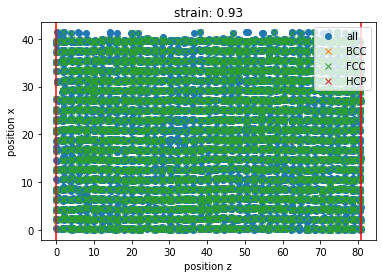

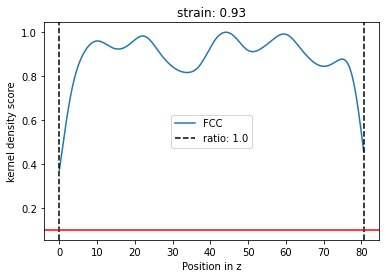

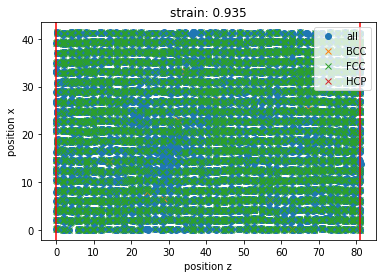

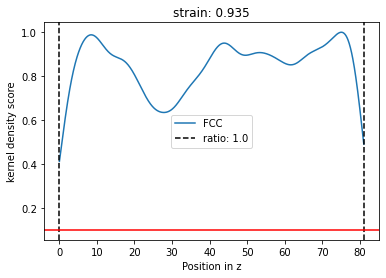

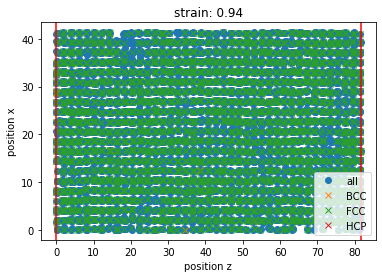

...

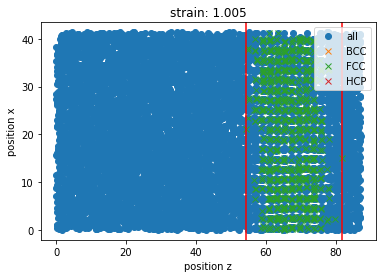

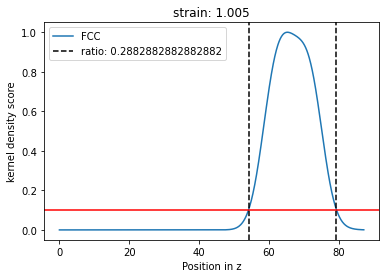

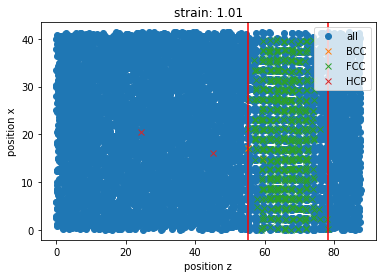

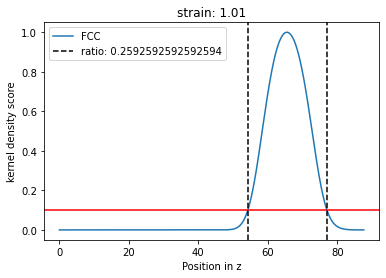

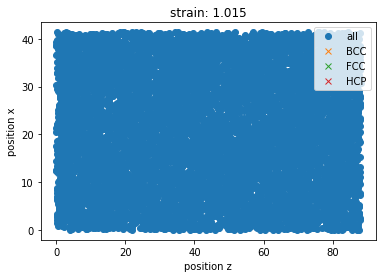

No handles with labels found to put in legend.


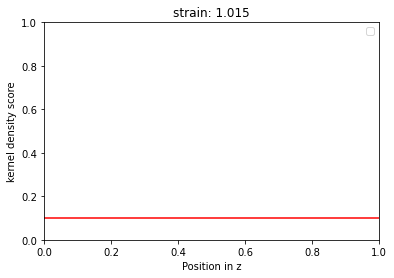

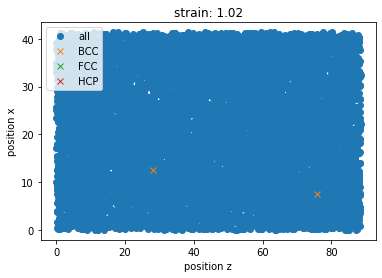

No handles with labels found to put in legend.


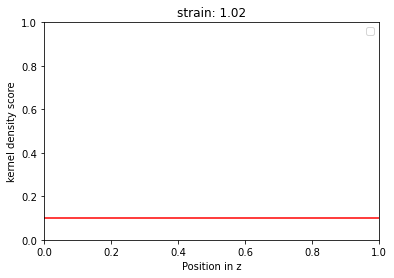

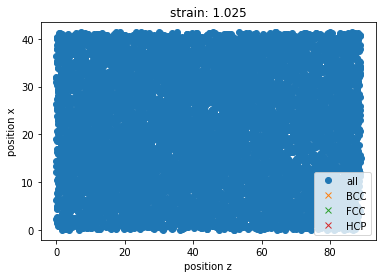

No handles with labels found to put in legend.


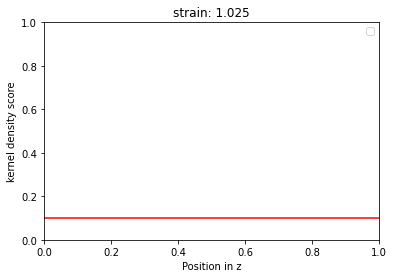

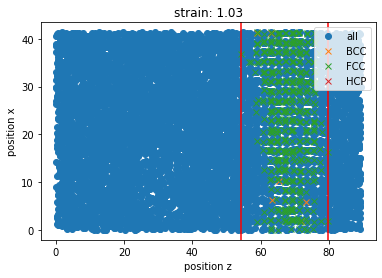

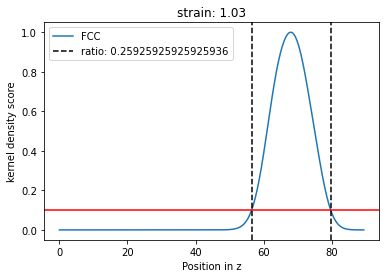

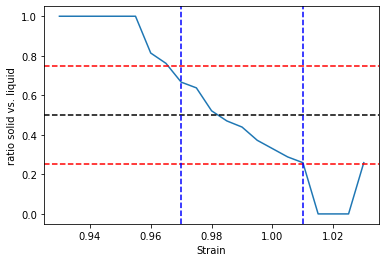

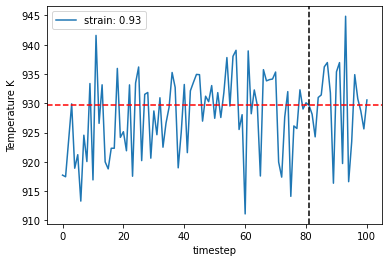

...

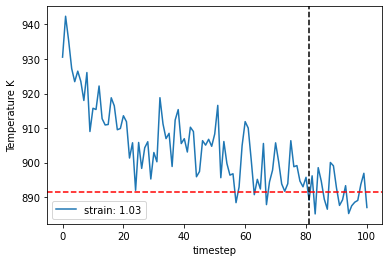

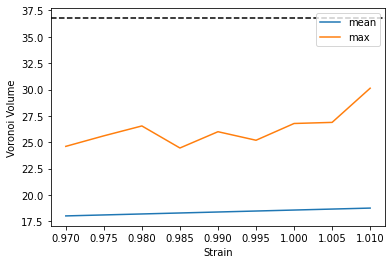

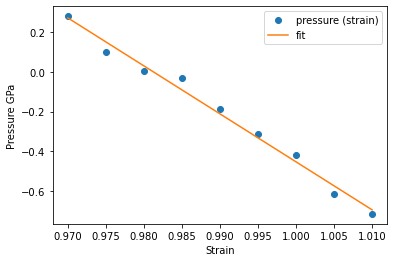

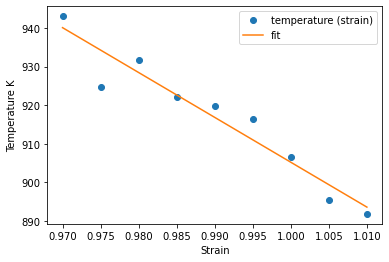

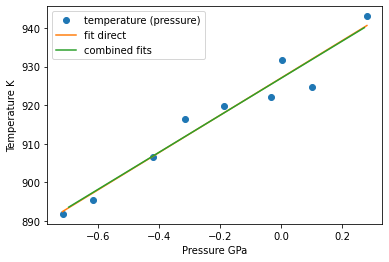

927.030272019361 926.9629059555433
927.030272019361 917.4370884169181 904.65580082161 930.2183760122261
{'timestep': 2, 'fit_range': 0.01, 'nve_run_time_steps': 20000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 927.030272019361, 'center': 0.98}


The job ham_npt_solid_927_03 was saved and received the ID: 101


The job ham_npt_liquid_high_1927_03 was saved and received the ID: 102


The job ham_npt_liquid_low_927_03 was saved and received the ID: 103


2020-05-04 15:35:57,115 - pyiron_log - WARNING - Job 'ham_nve_0_97_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_97_927_03_1 was saved and received the ID: 104


2020-05-04 15:38:16,959 - pyiron_log - WARNING - Job 'ham_nve_0_971_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_971_927_03_1 was saved and received the ID: 105


2020-05-04 15:41:00,350 - pyiron_log - WARNING - Job 'ham_nve_0_972_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_972_927_03_1 was saved and received the ID: 106


2020-05-04 15:43:28,726 - pyiron_log - WARNING - Job 'ham_nve_0_973_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_973_927_03_1 was saved and received the ID: 107


2020-05-04 15:45:51,412 - pyiron_log - WARNING - Job 'ham_nve_0_974_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_974_927_03_1 was saved and received the ID: 108


2020-05-04 15:48:12,208 - pyiron_log - WARNING - Job 'ham_nve_0_975_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_975_927_03_1 was saved and received the ID: 109


2020-05-04 15:51:00,300 - pyiron_log - WARNING - Job 'ham_nve_0_976_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_976_927_03_1 was saved and received the ID: 110


2020-05-04 15:53:31,350 - pyiron_log - WARNING - Job 'ham_nve_0_977_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_977_927_03_1 was saved and received the ID: 111


2020-05-04 15:56:04,333 - pyiron_log - WARNING - Job 'ham_nve_0_978_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_978_927_03_1 was saved and received the ID: 112


2020-05-04 15:58:34,751 - pyiron_log - WARNING - Job 'ham_nve_0_979_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_979_927_03_1 was saved and received the ID: 113


2020-05-04 16:00:52,211 - pyiron_log - WARNING - Job 'ham_nve_0_98_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_98_927_03_1 was saved and received the ID: 114


2020-05-04 16:03:17,441 - pyiron_log - WARNING - Job 'ham_nve_0_981_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_981_927_03_1 was saved and received the ID: 115


2020-05-04 16:05:47,589 - pyiron_log - WARNING - Job 'ham_nve_0_982_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_982_927_03_1 was saved and received the ID: 116


2020-05-04 16:08:16,803 - pyiron_log - WARNING - Job 'ham_nve_0_983_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_983_927_03_1 was saved and received the ID: 117


2020-05-04 16:10:50,744 - pyiron_log - WARNING - Job 'ham_nve_0_984_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_984_927_03_1 was saved and received the ID: 118


2020-05-04 16:13:41,212 - pyiron_log - WARNING - Job 'ham_nve_0_985_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_985_927_03_1 was saved and received the ID: 119


2020-05-04 16:16:05,217 - pyiron_log - WARNING - Job 'ham_nve_0_986_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_986_927_03_1 was saved and received the ID: 120


2020-05-04 16:18:35,798 - pyiron_log - WARNING - Job 'ham_nve_0_987_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_987_927_03_1 was saved and received the ID: 121


2020-05-04 16:20:49,241 - pyiron_log - WARNING - Job 'ham_nve_0_988_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_988_927_03_1 was saved and received the ID: 122


2020-05-04 16:23:37,251 - pyiron_log - WARNING - Job 'ham_nve_0_989_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_989_927_03_1 was saved and received the ID: 123


2020-05-04 16:25:54,804 - pyiron_log - WARNING - Job 'ham_nve_0_99_927_03_1' does not exist and cannot be loaded


The job ham_nvt_0_99_927_03_1 was saved and received the ID: 124


The job ham_nve_0_97_927_03_1 was saved and received the ID: 125


The job ham_nve_0_971_927_03_1 was saved and received the ID: 126


The job ham_nve_0_972_927_03_1 was saved and received the ID: 127


The job ham_nve_0_973_927_03_1 was saved and received the ID: 128


The job ham_nve_0_974_927_03_1 was saved and received the ID: 129


The job ham_nve_0_975_927_03_1 was saved and received the ID: 130


The job ham_nve_0_976_927_03_1 was saved and received the ID: 131


The job ham_nve_0_977_927_03_1 was saved and received the ID: 132


The job ham_nve_0_978_927_03_1 was saved and received the ID: 133


The job ham_nve_0_979_927_03_1 was saved and received the ID: 134


The job ham_nve_0_98_927_03_1 was saved and received the ID: 135


The job ham_nve_0_981_927_03_1 was saved and received the ID: 136


The job ham_nve_0_982_927_03_1 was saved and received the ID: 137


The job ham_nve_0_983_927_03_1 was saved and received the ID: 138


The job ham_nve_0_984_927_03_1 was saved and received the ID: 139


The job ham_nve_0_985_927_03_1 was saved and received the ID: 140


The job ham_nve_0_986_927_03_1 was saved and received the ID: 141


The job ham_nve_0_987_927_03_1 was saved and received the ID: 142


The job ham_nve_0_988_927_03_1 was saved and received the ID: 143


The job ham_nve_0_989_927_03_1 was saved and received the ID: 144


The job ham_nve_0_99_927_03_1 was saved and received the ID: 145


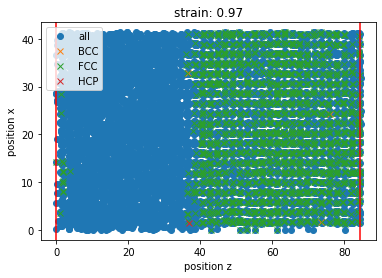

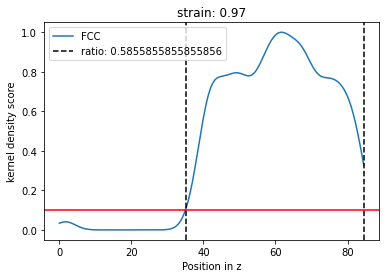

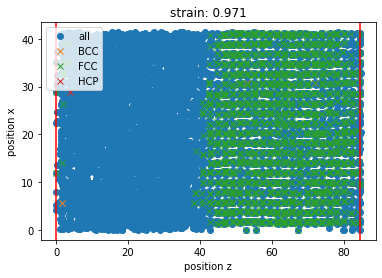

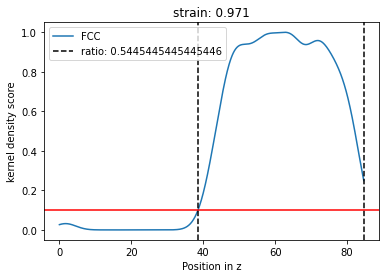

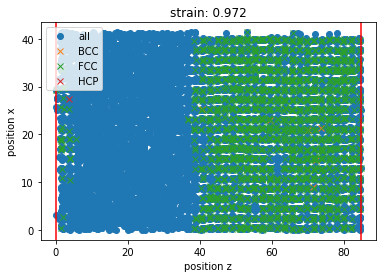

...

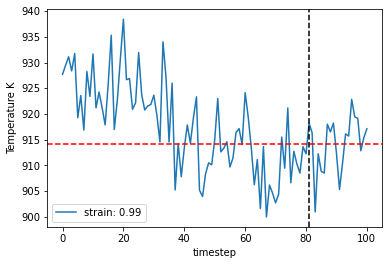

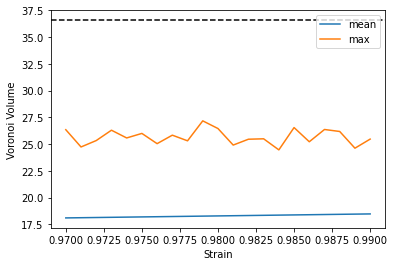

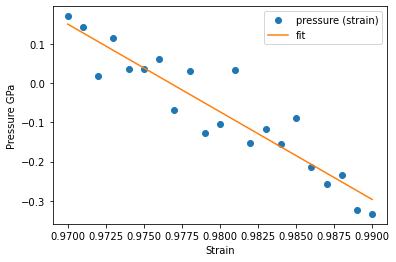

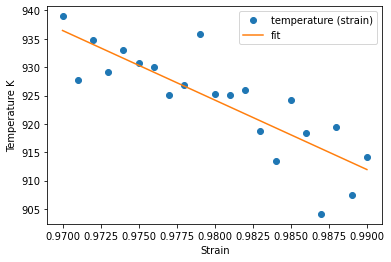

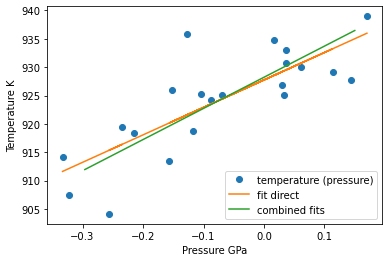

927.754669201799 928.2304746842995
927.754669201799 921.5604217459098 912.8485133964413 930.2723300953784
{'timestep': 1, 'fit_range': 0.01, 'nve_run_time_steps': 50000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 927.754669201799, 'center': 0.98}


The job ham_npt_solid_927_75 was saved and received the ID: 146


The job ham_npt_liquid_high_1927_75 was saved and received the ID: 147


The job ham_npt_liquid_low_927_75 was saved and received the ID: 148


2020-05-04 18:53:50,748 - pyiron_log - WARNING - Job 'ham_nve_0_97_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_97_927_75_2 was saved and received the ID: 149


2020-05-04 18:56:23,169 - pyiron_log - WARNING - Job 'ham_nve_0_971_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_971_927_75_2 was saved and received the ID: 150


2020-05-04 18:59:05,619 - pyiron_log - WARNING - Job 'ham_nve_0_972_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_972_927_75_2 was saved and received the ID: 151


2020-05-04 19:01:42,717 - pyiron_log - WARNING - Job 'ham_nve_0_973_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_973_927_75_2 was saved and received the ID: 152


2020-05-04 19:04:31,759 - pyiron_log - WARNING - Job 'ham_nve_0_974_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_974_927_75_2 was saved and received the ID: 153


2020-05-04 19:07:27,045 - pyiron_log - WARNING - Job 'ham_nve_0_975_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_975_927_75_2 was saved and received the ID: 154


2020-05-04 19:09:40,846 - pyiron_log - WARNING - Job 'ham_nve_0_976_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_976_927_75_2 was saved and received the ID: 155


2020-05-04 19:12:16,466 - pyiron_log - WARNING - Job 'ham_nve_0_977_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_977_927_75_2 was saved and received the ID: 156


2020-05-04 19:14:46,252 - pyiron_log - WARNING - Job 'ham_nve_0_978_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_978_927_75_2 was saved and received the ID: 157


2020-05-04 19:17:13,363 - pyiron_log - WARNING - Job 'ham_nve_0_979_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_979_927_75_2 was saved and received the ID: 158


2020-05-04 19:19:51,859 - pyiron_log - WARNING - Job 'ham_nve_0_98_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_98_927_75_2 was saved and received the ID: 159


2020-05-04 19:22:33,257 - pyiron_log - WARNING - Job 'ham_nve_0_981_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_981_927_75_2 was saved and received the ID: 160


2020-05-04 19:25:22,432 - pyiron_log - WARNING - Job 'ham_nve_0_982_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_982_927_75_2 was saved and received the ID: 161


2020-05-04 19:27:44,726 - pyiron_log - WARNING - Job 'ham_nve_0_983_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_983_927_75_2 was saved and received the ID: 162


2020-05-04 19:30:13,814 - pyiron_log - WARNING - Job 'ham_nve_0_984_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_984_927_75_2 was saved and received the ID: 163


2020-05-04 19:32:42,493 - pyiron_log - WARNING - Job 'ham_nve_0_985_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_985_927_75_2 was saved and received the ID: 164


2020-05-04 19:34:59,521 - pyiron_log - WARNING - Job 'ham_nve_0_986_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_986_927_75_2 was saved and received the ID: 165


2020-05-04 19:37:21,721 - pyiron_log - WARNING - Job 'ham_nve_0_987_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_987_927_75_2 was saved and received the ID: 166


2020-05-04 19:40:02,227 - pyiron_log - WARNING - Job 'ham_nve_0_988_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_988_927_75_2 was saved and received the ID: 167


2020-05-04 19:42:31,377 - pyiron_log - WARNING - Job 'ham_nve_0_989_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_989_927_75_2 was saved and received the ID: 168


2020-05-04 19:45:07,965 - pyiron_log - WARNING - Job 'ham_nve_0_99_927_75_2' does not exist and cannot be loaded


The job ham_nvt_0_99_927_75_2 was saved and received the ID: 169


The job ham_nve_0_97_927_75_2 was saved and received the ID: 170


The job ham_nve_0_971_927_75_2 was saved and received the ID: 171


The job ham_nve_0_972_927_75_2 was saved and received the ID: 172


The job ham_nve_0_973_927_75_2 was saved and received the ID: 173


The job ham_nve_0_974_927_75_2 was saved and received the ID: 174


The job ham_nve_0_975_927_75_2 was saved and received the ID: 175


The job ham_nve_0_976_927_75_2 was saved and received the ID: 176


The job ham_nve_0_977_927_75_2 was saved and received the ID: 177


The job ham_nve_0_978_927_75_2 was saved and received the ID: 178


The job ham_nve_0_979_927_75_2 was saved and received the ID: 179


The job ham_nve_0_98_927_75_2 was saved and received the ID: 180


The job ham_nve_0_981_927_75_2 was saved and received the ID: 181


The job ham_nve_0_982_927_75_2 was saved and received the ID: 182


The job ham_nve_0_983_927_75_2 was saved and received the ID: 183


The job ham_nve_0_984_927_75_2 was saved and received the ID: 184


The job ham_nve_0_985_927_75_2 was saved and received the ID: 185


The job ham_nve_0_986_927_75_2 was saved and received the ID: 186


The job ham_nve_0_987_927_75_2 was saved and received the ID: 187


The job ham_nve_0_988_927_75_2 was saved and received the ID: 188


The job ham_nve_0_989_927_75_2 was saved and received the ID: 189


The job ham_nve_0_99_927_75_2 was saved and received the ID: 190


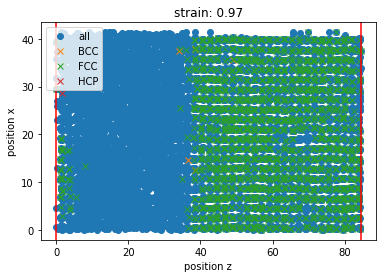

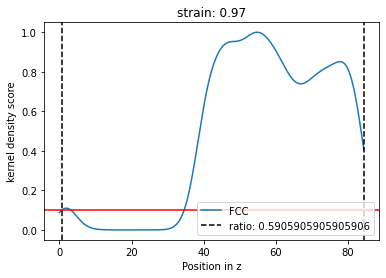

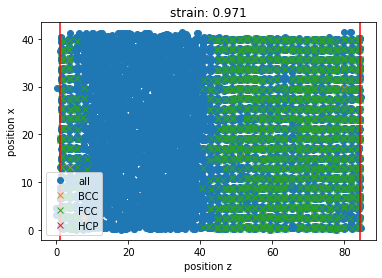

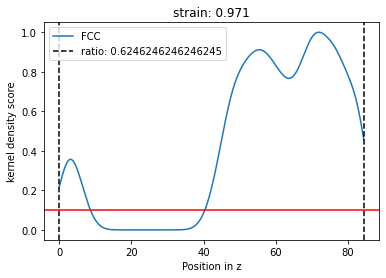

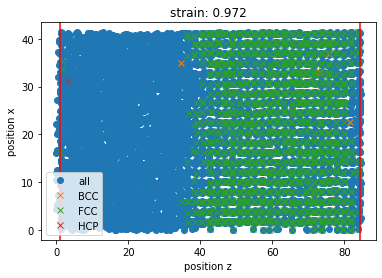

...

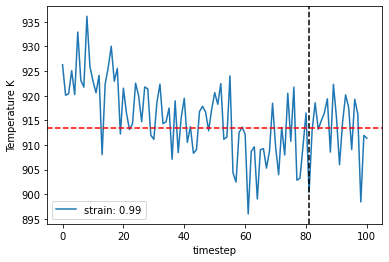

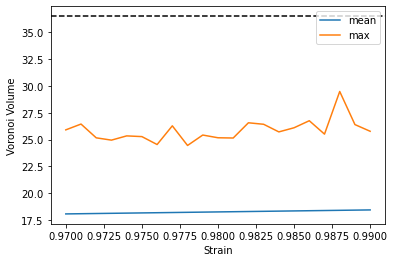

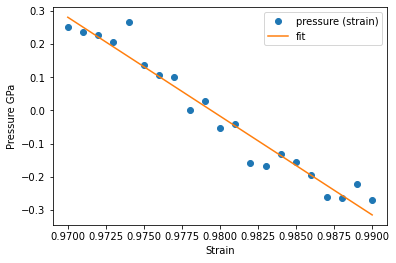

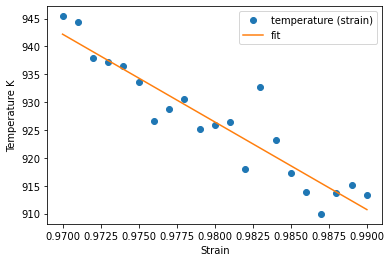

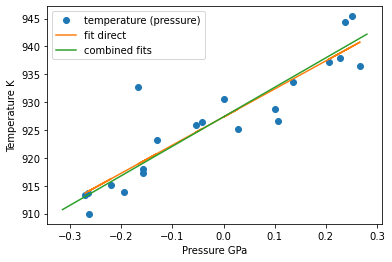

927.3320026106543 927.3754784446309
927.3320026106543 927.6797386196375 918.8122544543642 936.5472227849109
{'timestep': 1, 'fit_range': 0.01, 'nve_run_time_steps': 50000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 927.3320026106543, 'center': 0.98}


In [36]:
temperature_estimate_lst, temperature_calculated_lst = [], []
while len(temperature_calculated_lst) < 3 or not convergence_goal_achieved and len(temperature_calculated_lst) < 10:
    temperature_estimate_lst.append(temperature_next)
    temperature_next, temperature_mean, temperature_left, temperature_right, strain_result_lst, pressure_result_lst = calc_temp_iteration(
        basis=ham_minimize_vol.get_structure().repeat([1,1,2]), 
        temperature_next=temperature_next, 
        project_parameter=project_parameter,
        timestep=timestep,
        nve_run_time_steps=nve_run_time_steps, 
        fit_range=fit_range,  
        center=center,
        debug_plot=True)
    print(temperature_next, temperature_mean, temperature_left, temperature_right)
    output = validate_convergence(pr=pr,
                                  temperature_left=temperature_left, 
                                  temperature_next=temperature_next, 
                                  temperature_right=temperature_right, 
                                  enable_iteration=enable_iteration,
                                  timestep_iter=timestep_iter,
                                  timestep_lst=project_parameter['timestep_lst'],
                                  timestep=timestep,
                                  fit_range_iter=fit_range_iter, 
                                  fit_range_lst=project_parameter['fit_range_lst'], 
                                  fit_range=fit_range, 
                                  nve_run_time_steps_iter=nve_run_time_steps_iter, 
                                  nve_run_time_steps_lst=project_parameter['nve_run_time_steps_lst'], 
                                  nve_run_time_steps=nve_run_time_steps,
                                  strain_result_lst=strain_result_lst, 
                                  pressure_result_lst=pressure_result_lst, 
                                  step_count=step_count, 
                                  step_dict=step_dict, 
                                  boundary_value=project_parameter['boundary_value'], 
                                  ratio_boundary=project_parameter['ratio_boundary'],
                                  convergence_goal=project_parameter['convergence_criterion'],
                                  output_file=output_file)
    convergence_goal_achieved, enable_iteration, step_count, step_dict, timestep, fit_range, nve_run_time_steps, boundary_value, ratio_boundary, temperature_next, center = output
    print(step_dict[step_count])
    temperature_calculated_lst.append(temperature_next)

In [37]:
if not os.path.exists(output_file):
    with open(output_file, 'w') as f:
        json.dump(step_dict, f)

In [38]:
step_dict

{0: {'temperature_next': 914},
 1: {'timestep': 2,
  'fit_range': 0.05,
  'nve_run_time_steps': 25000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 924.6497033033917,
  'center': 0.98},
 2: {'timestep': 2,
  'fit_range': 0.01,
  'nve_run_time_steps': 20000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 927.030272019361,
  'center': 0.98},
 3: {'timestep': 1,
  'fit_range': 0.01,
  'nve_run_time_steps': 50000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 927.754669201799,
  'center': 0.98},
 4: {'timestep': 1,
  'fit_range': 0.01,
  'nve_run_time_steps': 50000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 927.3320026106543,
  'center': 0.98}}

findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.


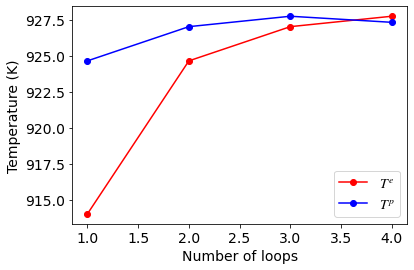

In [39]:
#plot the convergence of loop calculations
first_key = list(step_dict.keys())[-1]
second_key = 'temperature_next'
allt = [step_dict[key][second_key] for key in list(step_dict.keys())]
plt.plot(np.arange(1, len(allt)), allt[0:-1], 'ro-', label=r"$T^e$")
plt.plot(np.arange(1, len(allt)), allt[1:], 'bo-', label=r"$T^p$")
plt.legend(fontsize=14)
plt.tick_params(axis='both', labelsize=14)
plt.xlabel('Number of loops', fontsize=14)
plt.ylabel('Temperature (K)', fontsize=14)
plt.show()

In [40]:
df = pr.job_table()
df

,id,status,chemicalformula,job,subjob,projectpath,project,timestart,timestop,totalcputime,computer,hamilton,hamversion,parentid,masterid
0,1,finished,Al4000,minimize_pos,/minimize_pos,/scratch/janssen/pyiron_meltingpoint_al/,melting/,2020-05-04 07:28:40.174583,2020-05-04 07:28:41.288643,1.0,pyiron@cmpc14.mpie.de#8,Lammps,0.1,NaN,None
1,2,finished,Al4000,minimize_vol,/minimize_vol,/scratch/janssen/pyiron_meltingpoint_al/,melting/,2020-05-04 07:28:43.825329,2020-05-04 07:28:45.053530,1.0,pyiron@cmpc14.mpie.de#8,Lammps,0.1,NaN,None
2,3,finished,Al4000,temp_heating_1000,/temp_heating_1000,/scratch/janssen/pyiron_meltingpoint_al/,melting/,2020-05-04 07:28:46.209128,2020-05-04 07:28:56.386711,10.0,pyiron@cmpc14.mpie.de#8,Lammps,0.1,NaN,None
3,4,finished,Al4000,temp_heating_500_0,/temp_heating_500_0,/scratch/janssen/pyiron_meltingpoint_al/,melting/,2020-05-04 07:28:57.128083,2020-05-04 07:29:06.813312,9.0,pyiron@cmpc14.mpie.de#8,Lammps,0.1,NaN,None
4,5,finished,Al4000,temp_heating_750_0,/temp_heating_750_0,/scratch/janssen/pyiron_meltingpoint_al/,melting/,2020-05-04 07:29:07.871804,2020-05-04 07:29:15.869412,7.0,pyiron@cmpc14.mpie.de#8,Lammps,0.1,NaN,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,186,finished,Al8000,ham_nve_0_986_927_75_2,/ham_nve_0_986_927_75_2,/scratch/janssen/pyiron_meltingpoint_al/,melting/,2020-05-04 23:05:02.447381,2020-05-04 23:18:05.923343,783.0,pyiron@cmpc14.mpie.de#8,Lammps,0.1,165.0,None
186,187,finished,Al8000,ham_nve_0_987_927_75_2,/ham_nve_0_987_927_75_2,/scratch/janssen/pyiron_meltingpoint_al/,melting/,2020-05-04 23:18:07.872301,2020-05-04 23:30:58.115572,770.0,pyiron@cmpc14.mpie.de#8,Lammps,0.1,166.0,None
187,188,finished,Al8000,ham_nve_0_988_927_75_2,/ham_nve_0_988_927_75_2,/scratch/janssen/pyiron_meltingpoint_al/,melting/,2020-05-04 23:31:00.261241,2020-05-04 23:43:50.772520,770.0,pyiron@cmpc14.mpie.de#8,Lammps,0.1,167.0,None
188,189,finished,Al8000,ham_nve_0_989_927_75_2,/ham_nve_0_989_927_75_2,/scratch/janssen/pyiron_meltingpoint_al/,melting/,2020-05-04 23:43:52.825239,2020-05-04 23:56:16.323703,743.0,pyiron@cmpc14.mpie.de#8,Lammps,0.1,168.0,None
